In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('C:/Users/Admin/Desktop/pothole v2'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:/Users/Admin/Desktop/pothole v2\model.h5
C:/Users/Admin/Desktop/pothole v2\.ipynb_checkpoints\Untitled-checkpoint.ipynb
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (1).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (10).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (11).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (12).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (2).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (3).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (4).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (5).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (6).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (7).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (8).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\C2 (9).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Cracks\Thumbs.db
C:/Users/Admin/Desktop/pothole v2\test\Patches\C3 (1).jpeg
C:/Users/Admin/Desktop/pothole v2\test\Patches\C3 (10).jpeg
C:/U

In [2]:
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# data visualisation and manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
 
#configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
%matplotlib inline  
style.use('fivethirtyeight')
sns.set(style='whitegrid',color_codes=True)

#model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,roc_curve,roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder

#preprocess.
from keras.preprocessing.image import ImageDataGenerator

#dl libraraies
from keras import backend as K
from keras import regularizers
from keras.models import Sequential
from keras.models import Model
from keras.layers import Dense
from keras.optimizers import Adam,SGD,Adagrad,Adadelta,RMSprop
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau

# specifically for cnn
from keras.layers import Dropout, Flatten,Activation
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import InputLayer
 
import tensorflow as tf
import random as rn

# specifically for manipulating zipped images and getting numpy arrays of pixel values of images.
import cv2                  
import numpy as np  
from tqdm import tqdm
import os                   
from random import shuffle  
from zipfile import ZipFile
from PIL import Image
import keras.preprocessing.image as img
from keras.applications.resnet50 import ResNet50

In [3]:
os.listdir('C:/Users/Admin/Desktop/pothole v2/train')

['Cracks', 'Patches', 'Plain', 'Pothole']

In [4]:
def make_train_data(label,DIR):
    for img in tqdm(os.listdir(DIR)):
        try:
            path = os.path.join(DIR,img)
            img = cv2.imread(path,cv2.IMREAD_COLOR)
            img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))

            X.append(np.array(img))
            Z.append(str(label))
        except:
            pass
        
def assign_label(img,label):
    return label

In [5]:
X=[]
Z=[]
IMG_SIZE=256
Plain='C:/Users/Admin/Desktop/pothole v2//train/Plain'
Pothole='C:/Users/Admin/Desktop/pothole v2//train/Pothole'
Cracks='C:/Users/Admin/Desktop/pothole v2//train/Cracks'
Patches='C:/Users/Admin/Desktop/pothole v2//train/Patches'

make_train_data('Plain',Plain)
make_train_data('Pothole',Pothole)
make_train_data('Cracks',Cracks)
make_train_data('Patches',Patches)

100%|████████████████████████████████████████████████████████████████████████████████| 225/225 [00:02<00:00, 99.84it/s]


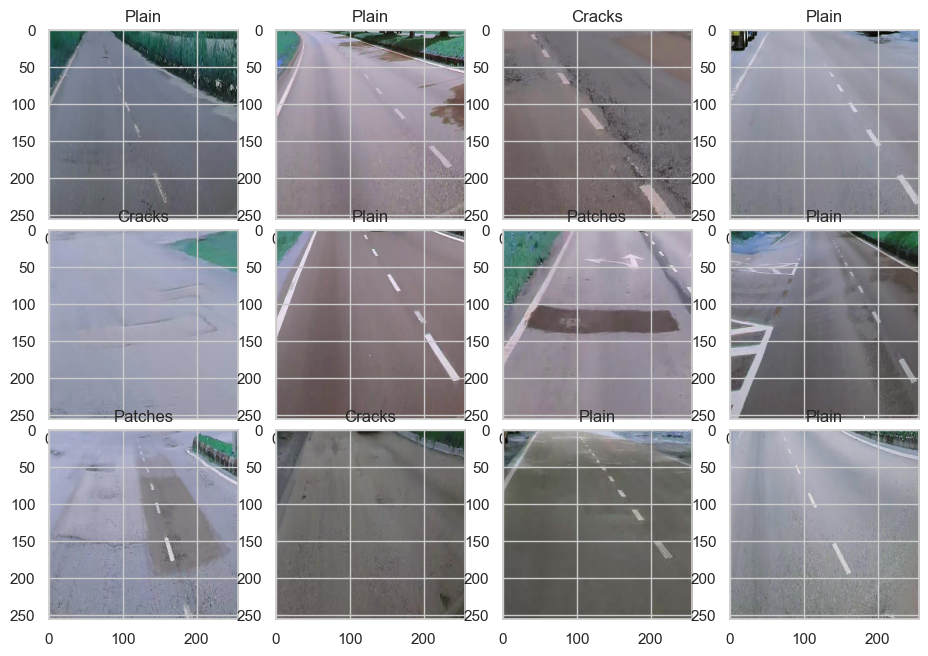

In [6]:
fig,ax=plt.subplots(3,4)
plt.subplots_adjust(bottom=0.3, top=0.7, hspace=0)
fig.set_size_inches(10,15)

for i in range(3):
    for j in range (4):
        l=rn.randint(0,len(Z))
        ax[i,j].imshow(X[l][:])
        ax[i,j].set_title(Z[l])
        ax[i,j].set_aspect('equal')

In [7]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
from sklearn.model_selection import train_test_split

# Your previous code for data preparation remains unchanged

# Custom mapping of labels to specific arrays
label_mapping = {
    'Pothole': [1, 0, 0, 0],
    'Cracks': [0, 1, 0, 0],
    'Patches': [0, 0, 1, 0],
    'Plain': [0, 0, 0, 1]
}

# Encoding labels using LabelEncoder
le = LabelEncoder()
Y = le.fit_transform(Z)

# Mapping encoded labels to the custom arrays
Y_encoded = np.array([label_mapping[label] for label in le.inverse_transform(Y)])

# Splitting the data
X = np.array(X)
x_train, x_test, y_train, y_test = train_test_split(X, Y_encoded, test_size=0.25, random_state=1337)

# Setting seed for random number generation
np.random.seed(42)
rn.seed(42)


In [8]:
base_model=ResNet50(include_top=False, weights='imagenet',input_shape=(256,256,3), pooling='max')
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

                                                                                                  
 conv2_block3_1_conv (Conv2  (None, 64, 64, 64)           16448     ['conv2_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv2_block3_1_bn (BatchNo  (None, 64, 64, 64)           256       ['conv2_block3_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block3_1_relu (Activ  (None, 64, 64, 64)           0         ['conv2_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv2_blo

 ation)                                                                                           
                                                                                                  
 conv3_block2_3_conv (Conv2  (None, 32, 32, 512)          66048     ['conv3_block2_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block2_3_bn (BatchNo  (None, 32, 32, 512)          2048      ['conv3_block2_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block2_add (Add)      (None, 32, 32, 512)          0         ['conv3_block1_out[0][0]',    
                                                                     'conv3_block2_3_bn[0][0]']   
          

 conv4_block1_2_conv (Conv2  (None, 16, 16, 256)          590080    ['conv4_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block1_2_bn (BatchNo  (None, 16, 16, 256)          1024      ['conv4_block1_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_2_relu (Activ  (None, 16, 16, 256)          0         ['conv4_block1_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_0_conv (Conv2  (None, 16, 16, 1024)         525312    ['conv3_block4_out[0][0]']    
 D)       

                                                                                                  
 conv4_block3_out (Activati  (None, 16, 16, 1024)         0         ['conv4_block3_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv4_block4_1_conv (Conv2  (None, 16, 16, 256)          262400    ['conv4_block3_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv4_block4_1_bn (BatchNo  (None, 16, 16, 256)          1024      ['conv4_block4_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block6_3_bn (BatchNo  (None, 16, 16, 1024)         4096      ['conv4_block6_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block6_add (Add)      (None, 16, 16, 1024)         0         ['conv4_block5_out[0][0]',    
                                                                     'conv4_block6_3_bn[0][0]']   
                                                                                                  
 conv4_block6_out (Activati  (None, 16, 16, 1024)         0         ['conv4_block6_add[0][0]']    
 on)                                                                                              
          

 conv5_block3_1_relu (Activ  (None, 8, 8, 512)            0         ['conv5_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv5_block3_2_conv (Conv2  (None, 8, 8, 512)            2359808   ['conv5_block3_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block3_2_bn (BatchNo  (None, 8, 8, 512)            2048      ['conv5_block3_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block3_2_relu (Activ  (None, 8, 8, 512)            0         ['conv5_block3_2_bn[0][0]']   
 ation)   

In [9]:
model = Sequential()
model.add(base_model)
model.add(Dropout(0.25))
model.add(Dense(2048, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(256, activation='relu')) 
model.add(Dense(4, activation='softmax'))


In [10]:
from keras.callbacks import EarlyStopping
epochs=30
batch_size=128
red_lr=ReduceLROnPlateau(monitor='val_acc', factor=0.1, min_delta=0.0001, patience=2, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
base_model.trainable=True # setting the VGG model to be trainable.
model.compile(optimizer=Adam(lr=1e-5),loss='categorical_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 2048)              4196352   
                                                                 
 dense_1 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_2 (Dense)             (None, 512)               524800    
                                                                 
 dense_3 (Dense)             (None, 256)               131328    
                                                                 
 dense_4 (Dense)             (None, 4)                 1

In [11]:
History = model.fit(x_train, y_train, epochs=epochs, validation_data=(x_test,y_test))

Epoch 1/30
61/61 [==============================] - 494s 8s/step - loss: 4.8762 - accuracy: 0.5267 - val_loss: 3032.3542 - val_accuracy: 0.5710
Epoch 2/30
61/61 [==============================] - 483s 8s/step - loss: 0.8764 - accuracy: 0.6728 - val_loss: 1.6526 - val_accuracy: 0.5802
Epoch 3/30
61/61 [==============================] - 476s 8s/step - loss: 0.7539 - accuracy: 0.7037 - val_loss: 1.1252 - val_accuracy: 0.7145
Epoch 4/30
61/61 [==============================] - 486s 8s/step - loss: 0.6926 - accuracy: 0.7366 - val_loss: 0.6309 - val_accuracy: 0.7562
Epoch 5/30
61/61 [==============================] - 474s 8s/step - loss: 0.6462 - accuracy: 0.7572 - val_loss: 0.6494 - val_accuracy: 0.7438
Epoch 6/30
61/61 [==============================] - 470s 8s/step - loss: 0.5958 - accuracy: 0.7721 - val_loss: 0.8242 - val_accuracy: 0.6944
Epoch 7/30
61/61 [==============================] - 471s 8s/step - loss: 0.5629 - accuracy: 0.7752 - val_loss: 0.8055 - val_accuracy: 0.7176
Epoch 8/30

In [12]:
model.save('C:/Users/Admin/Desktop/pothole v2/model.h5')

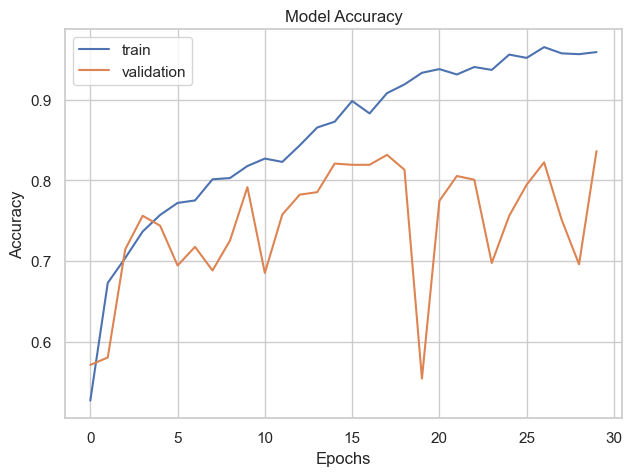

In [13]:
plt.plot(History.history['accuracy'])
plt.plot(History.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'])
plt.show()

In [14]:
path = "C:/Users/Admin/Desktop/pothole v2/test/Pothole"
files = os.listdir(path)
files

['C1 (1).jpeg',
 'C1 (2).jpeg',
 'C1 (3).jpeg',
 'C1 (4).jpeg',
 'C1 (5).jpeg',
 'C1 (6).jpeg',
 'C1 (7).jpeg',
 'C1 (8).jpeg',
 'Thumbs.db']

  0%|                                                                                            | 0/9 [00:00<?, ?it/s]

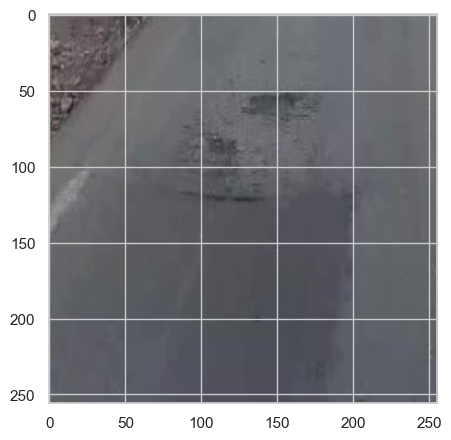

1/1 [==============================] - 1s 851ms/step


 11%|█████████▎                                                                          | 1/9 [00:01<00:08,  1.11s/it]

Cracks Road


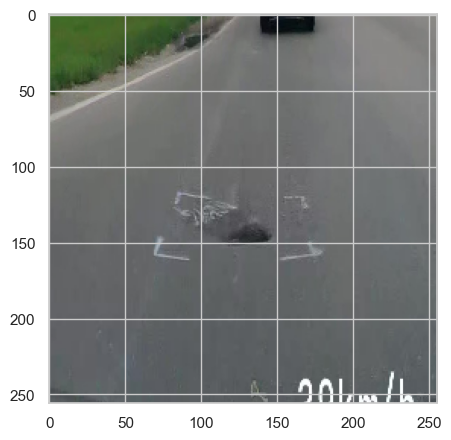

1/1 [==============================] - 0s 103ms/step


 22%|██████████████████▋                                                                 | 2/9 [00:01<00:04,  1.56it/s]

Pothole Road


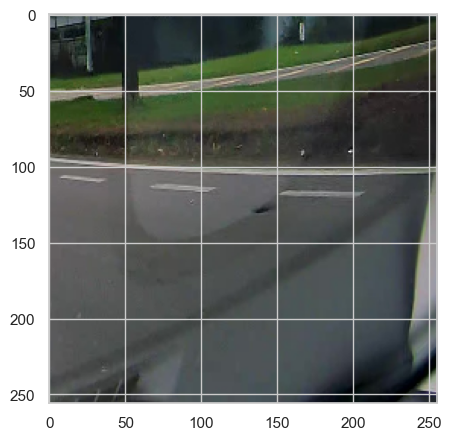

1/1 [==============================] - 0s 103ms/step


 33%|████████████████████████████                                                        | 3/9 [00:01<00:03,  1.95it/s]

Plain Road


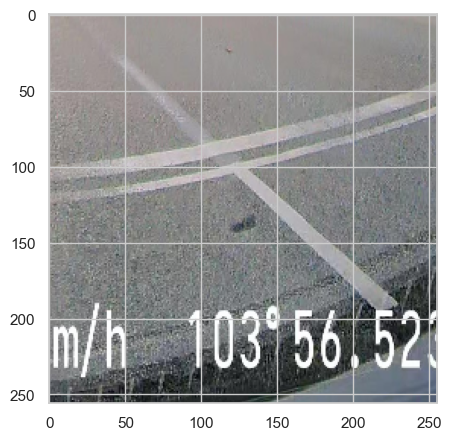

1/1 [==============================] - 0s 105ms/step


 44%|█████████████████████████████████████▎                                              | 4/9 [00:02<00:02,  2.15it/s]

Patches Road


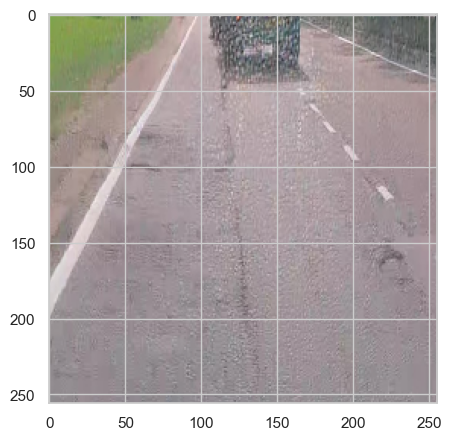

1/1 [==============================] - 0s 96ms/step


 56%|██████████████████████████████████████████████▋                                     | 5/9 [00:02<00:01,  2.33it/s]

Pothole Road


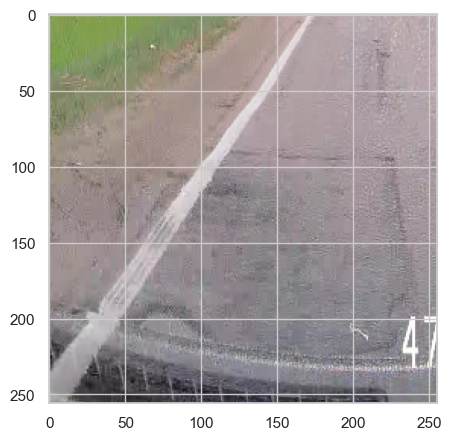

1/1 [==============================] - 0s 98ms/step


 67%|████████████████████████████████████████████████████████                            | 6/9 [00:02<00:01,  2.44it/s]

Pothole Road


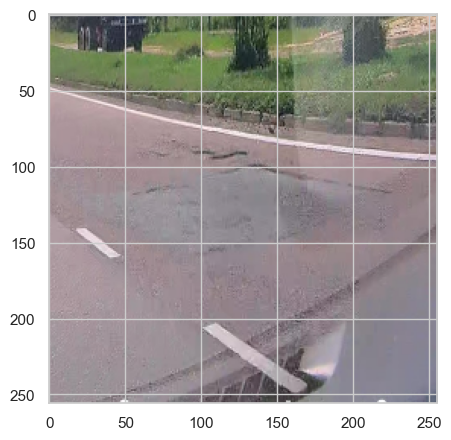

1/1 [==============================] - 0s 95ms/step


 78%|█████████████████████████████████████████████████████████████████▎                  | 7/9 [00:03<00:00,  2.51it/s]

Pothole Road


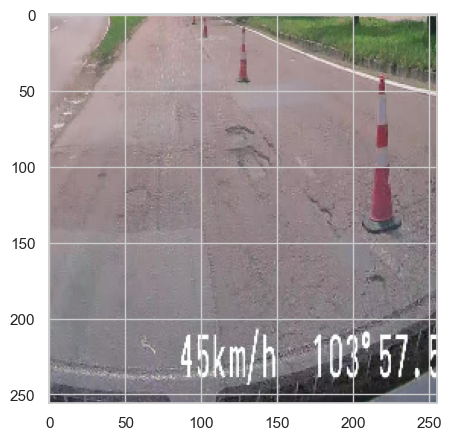

1/1 [==============================] - 0s 113ms/step


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.46it/s]

Patches Road
Skipping non-image file: Thumbs.db


In [15]:
import os

for i in tqdm(files):
    if not i.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
        print(f"Skipping non-image file: {i}")
        continue  # Skip non-image files

    pth = os.path.join(path, i)
    X = cv2.imread(pth, cv2.IMREAD_COLOR)

    if X is None or X.size == 0:
        print(f"Unable to read or empty image: {pth}")
        continue  # Skip to the next image if current one is problematic

    X = cv2.resize(X, (256, 256))

    plt.figure()
    plt.imshow(X[:, :, ::-1])
    plt.show()

    X = np.array(X)
    X = np.expand_dims(X, axis=0)

    y_pred = np.round(model.predict(X))
    if np.array_equal(y_pred[0], [1, 0, 0, 0]):
        print("Pothole Road")
    elif np.array_equal(y_pred[0], [0, 1, 0, 0]):
        print("Cracks Road")
    elif np.array_equal(y_pred[0], [0, 0, 1, 0]):
        print("Patches Road")
    else:
        print("Plain Road")



In [16]:
path = "C:/Users/Admin/Desktop/pothole v2/test/Cracks"
files = os.listdir(path)
files

['C2 (1).jpeg',
 'C2 (10).jpeg',
 'C2 (11).jpeg',
 'C2 (12).jpeg',
 'C2 (2).jpeg',
 'C2 (3).jpeg',
 'C2 (4).jpeg',
 'C2 (5).jpeg',
 'C2 (6).jpeg',
 'C2 (7).jpeg',
 'C2 (8).jpeg',
 'C2 (9).jpeg',
 'Thumbs.db']

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

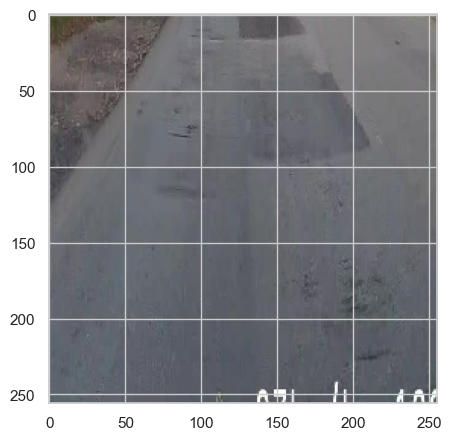

1/1 [==============================] - 0s 99ms/step


  8%|██████▍                                                                            | 1/13 [00:00<00:04,  2.90it/s]

Cracks Road


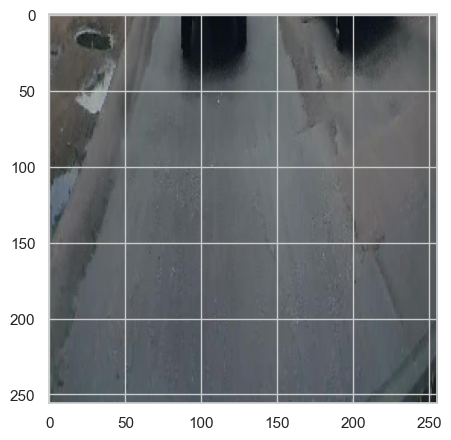

1/1 [==============================] - 0s 100ms/step


 15%|████████████▊                                                                      | 2/13 [00:00<00:03,  2.81it/s]

Cracks Road


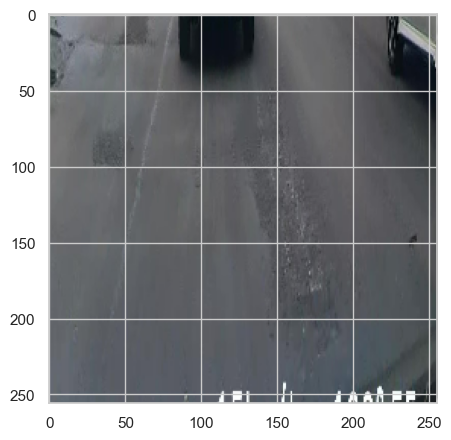

1/1 [==============================] - 0s 98ms/step


 23%|███████████████████▏                                                               | 3/13 [00:01<00:03,  2.96it/s]

Cracks Road


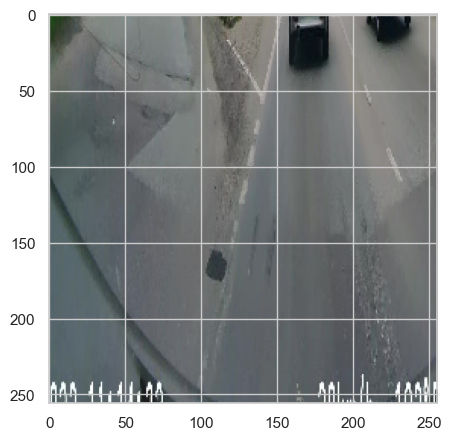

1/1 [==============================] - 0s 104ms/step


 31%|█████████████████████████▌                                                         | 4/13 [00:01<00:03,  2.84it/s]

Cracks Road


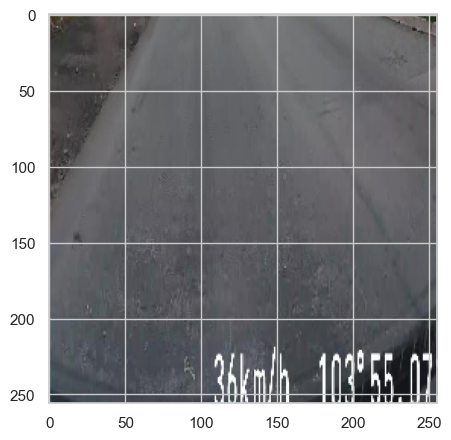

1/1 [==============================] - 0s 97ms/step


 38%|███████████████████████████████▉                                                   | 5/13 [00:01<00:02,  2.83it/s]

Cracks Road


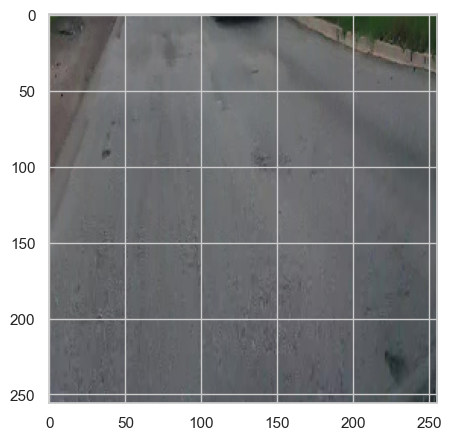

1/1 [==============================] - 0s 101ms/step


 46%|██████████████████████████████████████▎                                            | 6/13 [00:02<00:02,  2.83it/s]

Cracks Road


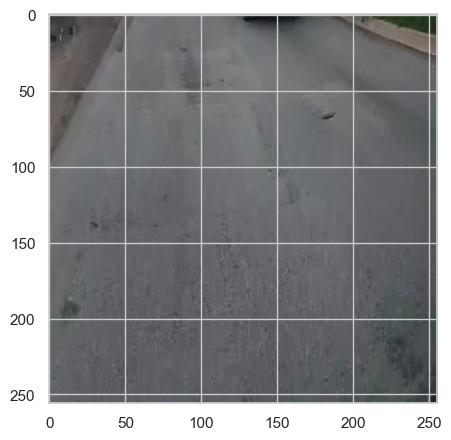

1/1 [==============================] - 0s 95ms/step


 54%|████████████████████████████████████████████▋                                      | 7/13 [00:02<00:02,  2.90it/s]

Cracks Road


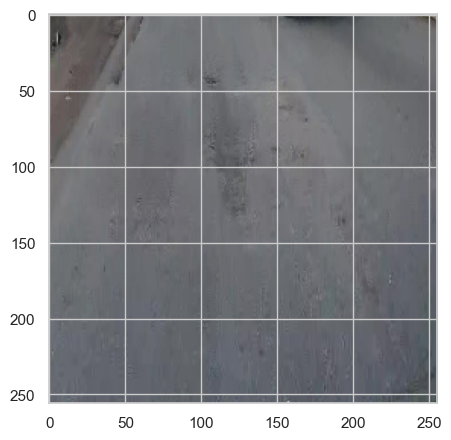

1/1 [==============================] - 0s 99ms/step


 62%|███████████████████████████████████████████████████                                | 8/13 [00:02<00:01,  2.97it/s]

Cracks Road


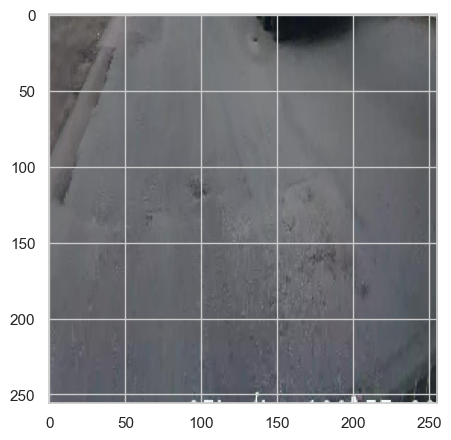

1/1 [==============================] - 0s 93ms/step


 69%|█████████████████████████████████████████████████████████▍                         | 9/13 [00:03<00:01,  2.93it/s]

Cracks Road


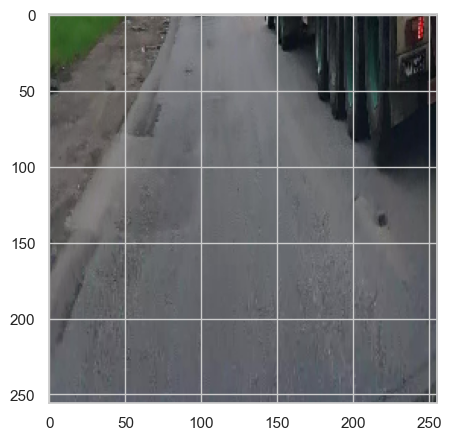

1/1 [==============================] - 0s 96ms/step


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:03<00:01,  2.88it/s]

Plain Road


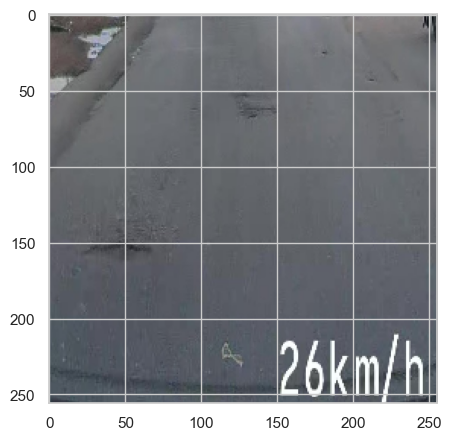

1/1 [==============================] - 0s 101ms/step


 85%|█████████████████████████████████████████████████████████████████████▍            | 11/13 [00:03<00:00,  2.99it/s]

Cracks Road


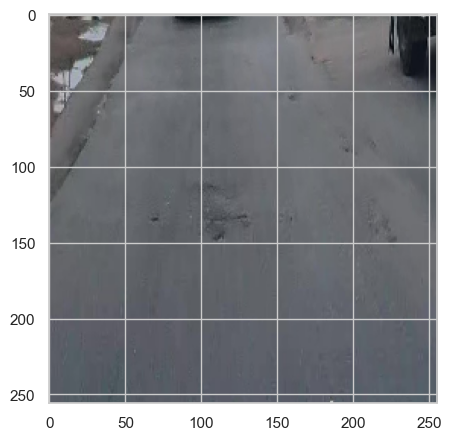

1/1 [==============================] - 0s 96ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:04<00:00,  3.14it/s]

Cracks Road
Skipping non-image file: Thumbs.db


In [17]:
import os

for i in tqdm(files):
    if not i.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
        print(f"Skipping non-image file: {i}")
        continue  # Skip non-image files

    pth = os.path.join(path, i)
    X = cv2.imread(pth, cv2.IMREAD_COLOR)

    if X is None or X.size == 0:
        print(f"Unable to read or empty image: {pth}")
        continue  # Skip to the next image if current one is problematic

    X = cv2.resize(X, (256, 256))

    plt.figure()
    plt.imshow(X[:, :, ::-1])
    plt.show()

    X = np.array(X)
    X = np.expand_dims(X, axis=0)

    y_pred = np.round(model.predict(X))
    if np.array_equal(y_pred[0], [1, 0, 0, 0]):
        print("Pothole Road")
    elif np.array_equal(y_pred[0], [0, 1, 0, 0]):
        print("Cracks Road")
    elif np.array_equal(y_pred[0], [0, 0, 1, 0]):
        print("Patches Road")
    else:
        print("Plain Road")

In [18]:
path = "C:/Users/Admin/Desktop/pothole v2/test/Patches"
files = os.listdir(path)
files

['C3 (1).jpeg',
 'C3 (10).jpeg',
 'C3 (11).jpeg',
 'C3 (12).jpeg',
 'C3 (2).jpeg',
 'C3 (3).jpeg',
 'C3 (4).jpeg',
 'C3 (5).jpeg',
 'C3 (6).jpeg',
 'C3 (7).jpeg',
 'C3 (8).jpeg',
 'C3 (9).jpeg',
 'Thumbs.db']

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

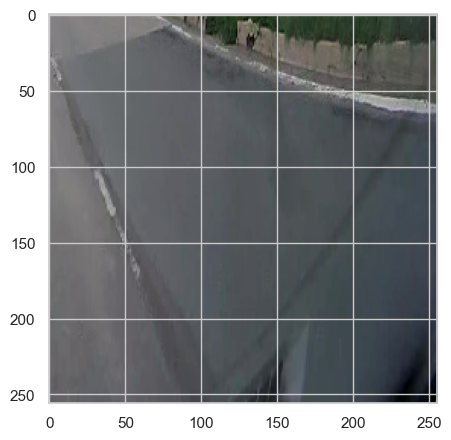

1/1 [==============================] - 0s 107ms/step


  8%|██████▍                                                                            | 1/13 [00:00<00:03,  3.10it/s]

Patches Road


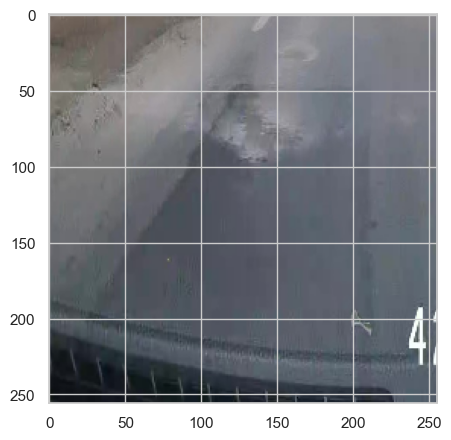

1/1 [==============================] - 0s 104ms/step


 15%|████████████▊                                                                      | 2/13 [00:00<00:03,  2.92it/s]

Patches Road


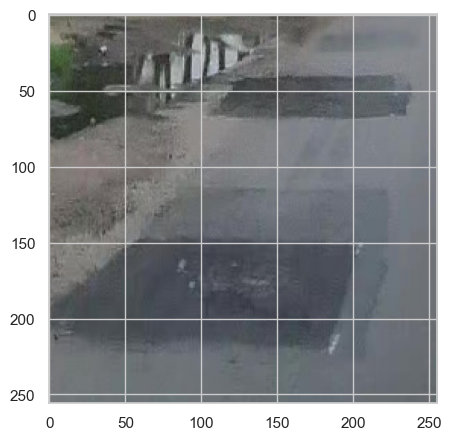

1/1 [==============================] - 0s 88ms/step


 23%|███████████████████▏                                                               | 3/13 [00:01<00:03,  2.84it/s]

Patches Road


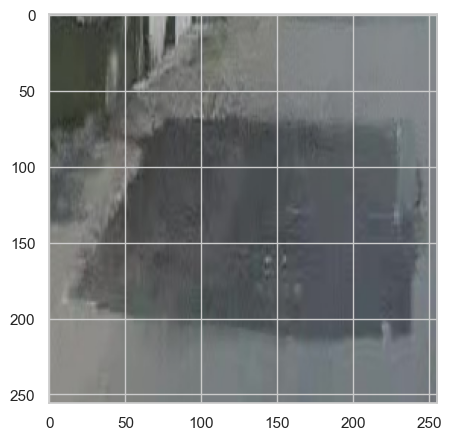

1/1 [==============================] - 0s 92ms/step


 31%|█████████████████████████▌                                                         | 4/13 [00:01<00:03,  2.98it/s]

Patches Road


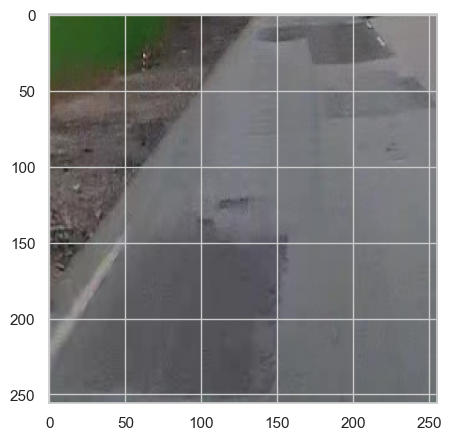

1/1 [==============================] - 0s 104ms/step


 38%|███████████████████████████████▉                                                   | 5/13 [00:01<00:02,  2.90it/s]

Patches Road


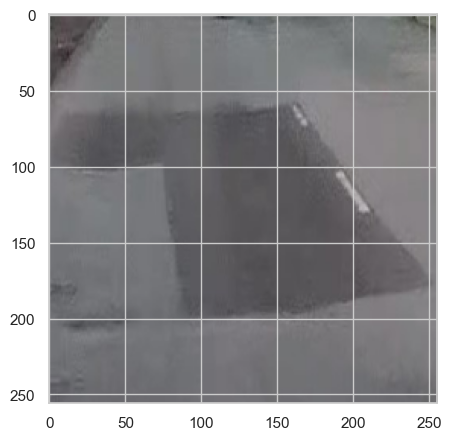

1/1 [==============================] - 0s 100ms/step


 46%|██████████████████████████████████████▎                                            | 6/13 [00:02<00:02,  2.94it/s]

Patches Road


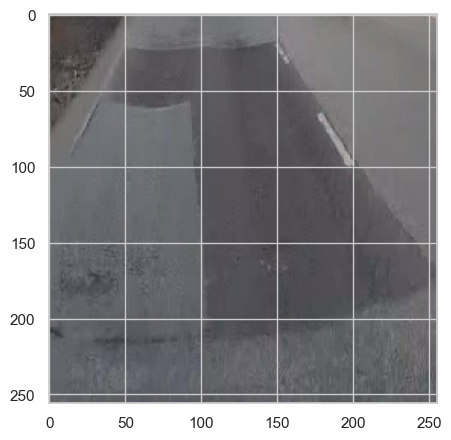

1/1 [==============================] - 0s 95ms/step


 54%|████████████████████████████████████████████▋                                      | 7/13 [00:02<00:02,  2.89it/s]

Patches Road


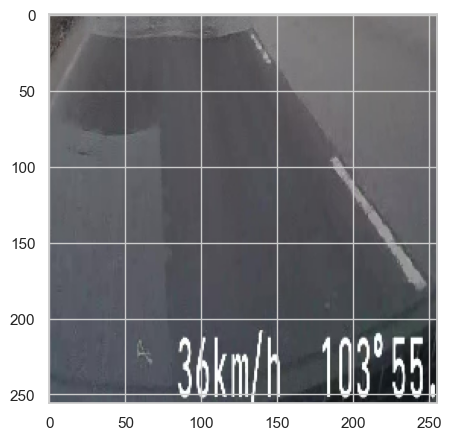

1/1 [==============================] - 0s 91ms/step


 62%|███████████████████████████████████████████████████                                | 8/13 [00:02<00:01,  2.87it/s]

Patches Road


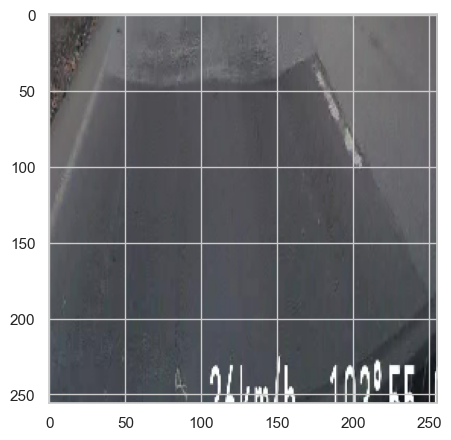

1/1 [==============================] - 0s 85ms/step


 69%|█████████████████████████████████████████████████████████▍                         | 9/13 [00:03<00:01,  2.86it/s]

Plain Road


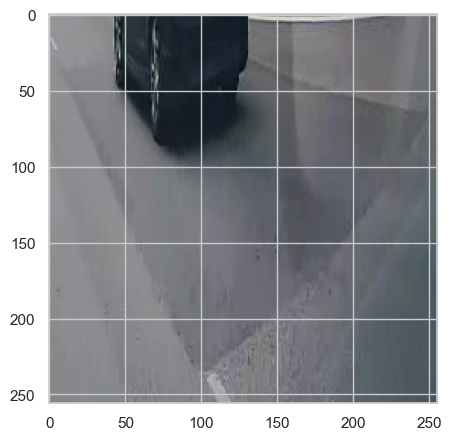

1/1 [==============================] - 0s 95ms/step


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:03<00:01,  2.87it/s]

Patches Road


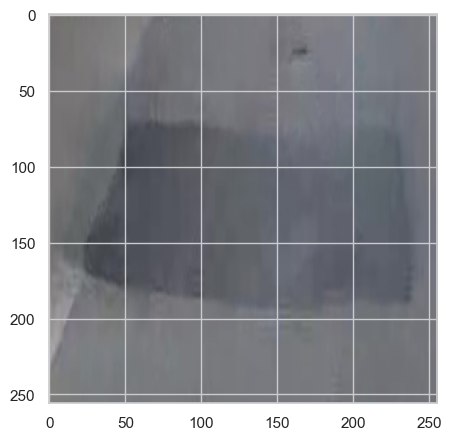

1/1 [==============================] - 0s 97ms/step


 85%|█████████████████████████████████████████████████████████████████████▍            | 11/13 [00:03<00:00,  2.90it/s]

Patches Road


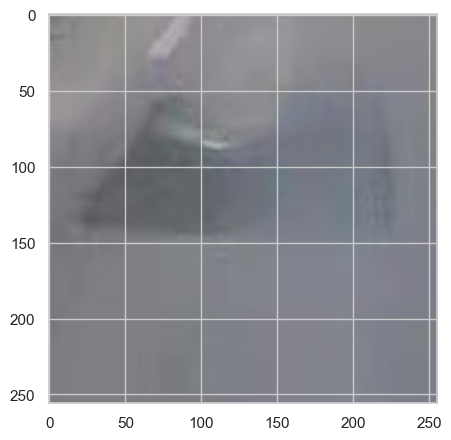

1/1 [==============================] - 0s 100ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:04<00:00,  3.15it/s]

Patches Road
Skipping non-image file: Thumbs.db


In [19]:
import os

for i in tqdm(files):
    if not i.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
        print(f"Skipping non-image file: {i}")
        continue  # Skip non-image files

    pth = os.path.join(path, i)
    X = cv2.imread(pth, cv2.IMREAD_COLOR)

    if X is None or X.size == 0:
        print(f"Unable to read or empty image: {pth}")
        continue  # Skip to the next image if current one is problematic

    X = cv2.resize(X, (256, 256))

    plt.figure()
    plt.imshow(X[:, :, ::-1])
    plt.show()

    X = np.array(X)
    X = np.expand_dims(X, axis=0)

    y_pred = np.round(model.predict(X))
    if np.array_equal(y_pred[0], [1, 0, 0, 0]):
        print("Pothole Road")
    elif np.array_equal(y_pred[0], [0, 1, 0, 0]):
        print("Cracks Road")
    elif np.array_equal(y_pred[0], [0, 0, 1, 0]):
        print("Patches Road")
    else:
        print("Plain Road")

In [20]:
path = "C:/Users/Admin/Desktop/pothole v2/test/Plain"
files = os.listdir(path)
files

['C4 (1).jpeg',
 'C4 (10).jpeg',
 'C4 (11).jpeg',
 'C4 (12).jpeg',
 'C4 (13).jpeg',
 'C4 (14).jpeg',
 'C4 (15).jpeg',
 'C4 (4).jpeg',
 'C4 (6).jpeg',
 'C4 (7).jpeg',
 'C4 (8).jpeg',
 'C4 (9).jpeg',
 'Thumbs.db']

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

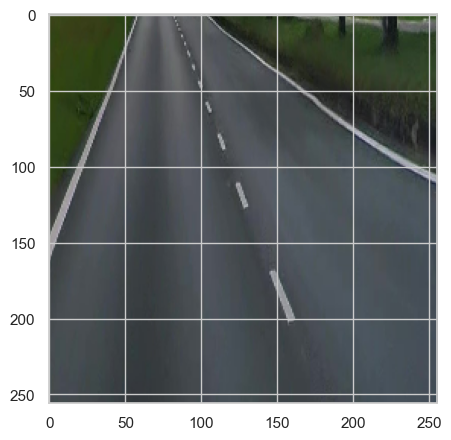

1/1 [==============================] - 0s 105ms/step


  8%|██████▍                                                                            | 1/13 [00:00<00:04,  2.77it/s]

Plain Road


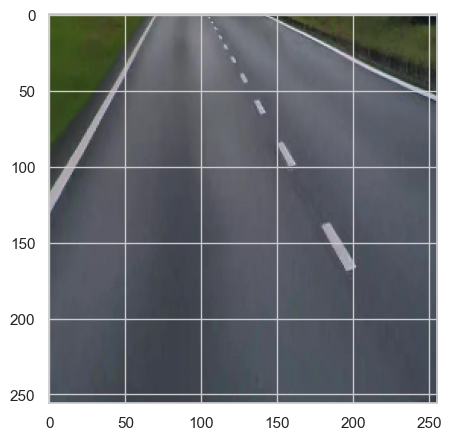

1/1 [==============================] - 0s 107ms/step


 15%|████████████▊                                                                      | 2/13 [00:00<00:03,  2.82it/s]

Plain Road


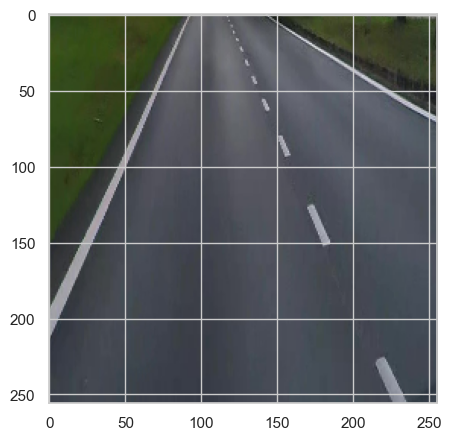

1/1 [==============================] - 0s 84ms/step


 23%|███████████████████▏                                                               | 3/13 [00:01<00:03,  2.83it/s]

Plain Road


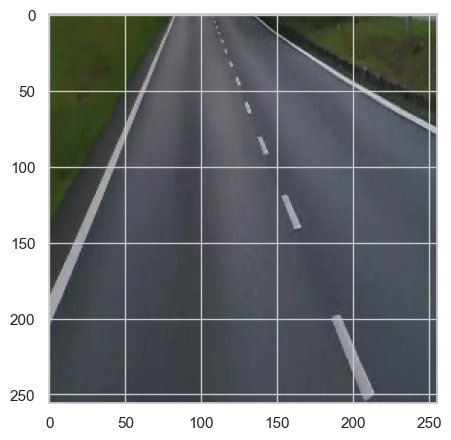

1/1 [==============================] - 0s 107ms/step


 31%|█████████████████████████▌                                                         | 4/13 [00:01<00:03,  2.95it/s]

Plain Road


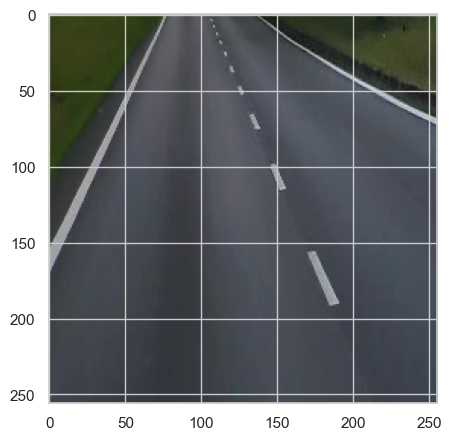

1/1 [==============================] - 0s 109ms/step


 38%|███████████████████████████████▉                                                   | 5/13 [00:01<00:02,  2.92it/s]

Plain Road


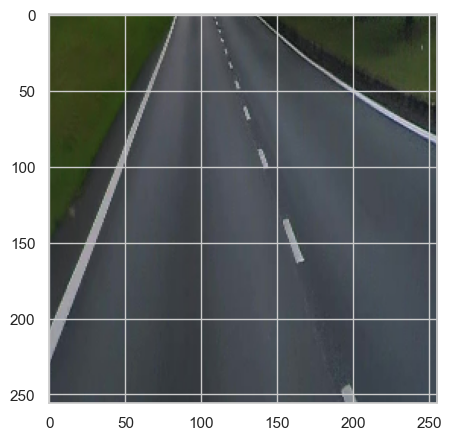

1/1 [==============================] - 0s 99ms/step


 46%|██████████████████████████████████████▎                                            | 6/13 [00:02<00:02,  2.88it/s]

Plain Road


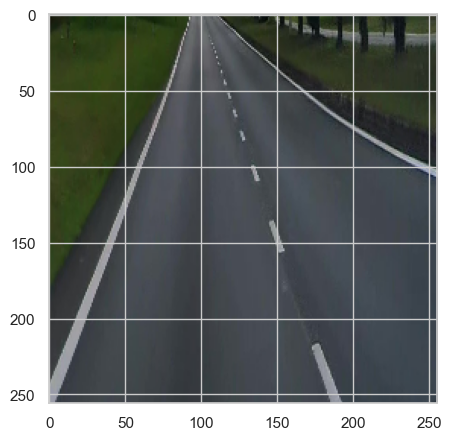

1/1 [==============================] - 0s 100ms/step


 54%|████████████████████████████████████████████▋                                      | 7/13 [00:02<00:02,  2.87it/s]

Plain Road


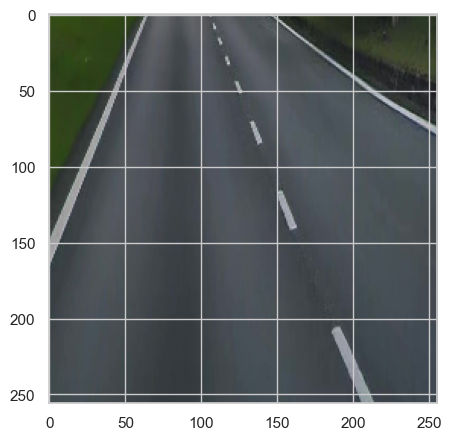

1/1 [==============================] - 0s 99ms/step


 62%|███████████████████████████████████████████████████                                | 8/13 [00:02<00:01,  2.83it/s]

Plain Road


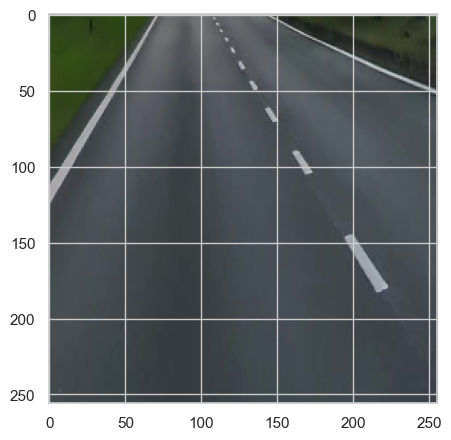

1/1 [==============================] - 0s 98ms/step


 69%|█████████████████████████████████████████████████████████▍                         | 9/13 [00:03<00:01,  2.84it/s]

Plain Road


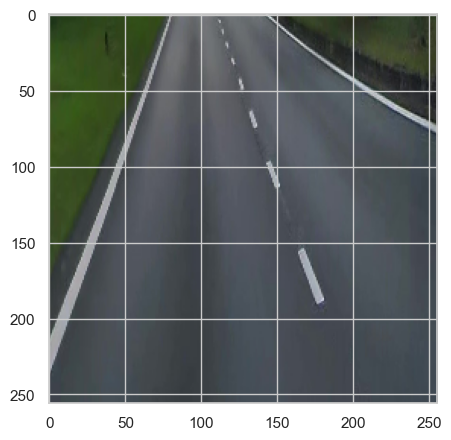

1/1 [==============================] - 0s 101ms/step


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:03<00:01,  2.83it/s]

Plain Road


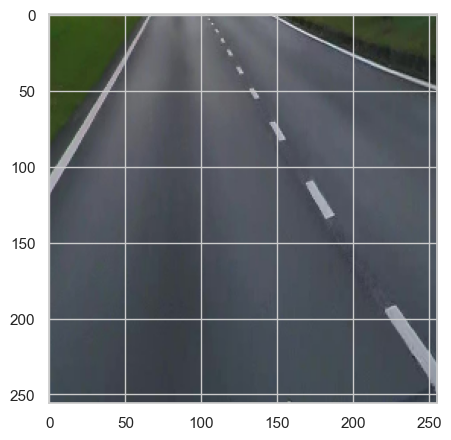

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████████████████████████████████▍            | 11/13 [00:03<00:00,  2.85it/s]

Plain Road


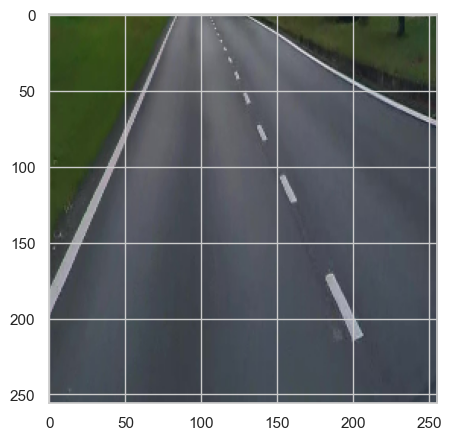

1/1 [==============================] - 0s 100ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:04<00:00,  3.09it/s]

Plain Road
Skipping non-image file: Thumbs.db


In [21]:
import os

for i in tqdm(files):
    if not i.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
        print(f"Skipping non-image file: {i}")
        continue  # Skip non-image files

    pth = os.path.join(path, i)
    X = cv2.imread(pth, cv2.IMREAD_COLOR)

    if X is None or X.size == 0:
        print(f"Unable to read or empty image: {pth}")
        continue  # Skip to the next image if current one is problematic

    X = cv2.resize(X, (256, 256))

    plt.figure()
    plt.imshow(X[:, :, ::-1])
    plt.show()

    X = np.array(X)
    X = np.expand_dims(X, axis=0)

    y_pred = np.round(model.predict(X))
    if np.array_equal(y_pred[0], [1, 0, 0, 0]):
        print("Pothole Road")
    elif np.array_equal(y_pred[0], [0, 1, 0, 0]):
        print("Cracks Road")
    elif np.array_equal(y_pred[0], [0, 0, 1, 0]):
        print("Patches Road")
    else:
        print("Plain Road")

In [22]:
# Absolutely, higher resolution images can often contribute to improved accuracy in this process.

In [23]:
predictions = model.predict(x_test)

# Calculate accuracy score
accuracy = accuracy_score(np.argmax(y_test, axis=1), np.argmax(predictions, axis=1))
print(f"Accuracy of the model: {accuracy * 100:.2f}%")

21/21 [==============================] - 29s 1s/step
Accuracy of the model: 83.64%


In [1]:
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# data visualisation and manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
 
#configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
%matplotlib inline  
style.use('fivethirtyeight')
sns.set(style='whitegrid',color_codes=True)

 
import tensorflow as tf
import random as rn

# specifically for manipulating zipped images and getting numpy arrays of pixel values of images.
import cv2                  
import numpy as np  
from tqdm import tqdm
import os                   
from random import shuffle  
from zipfile import ZipFile
from PIL import Image
import keras.preprocessing.image as img
from keras.applications.resnet50 import ResNet50

## Load the model.h5

  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

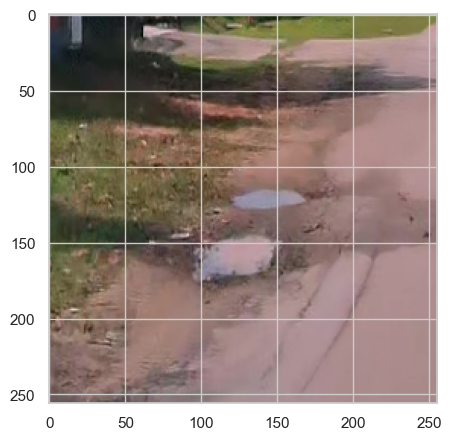

1/1 [==============================] - 1s 1s/step


 10%|████████▎                                                                          | 1/10 [00:01<00:12,  1.36s/it]

Pothole Road


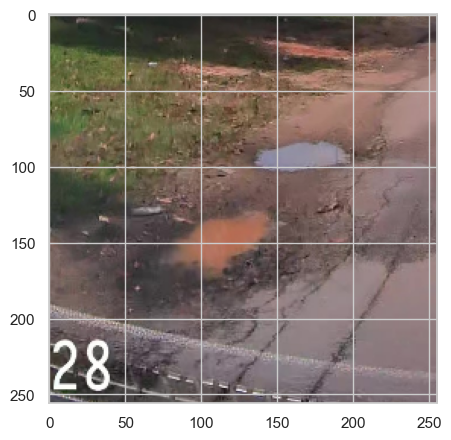

1/1 [==============================] - 0s 109ms/step


 20%|████████████████▌                                                                  | 2/10 [00:01<00:06,  1.30it/s]

Pothole Road


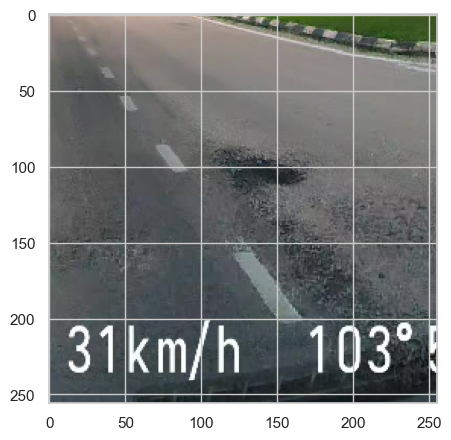

1/1 [==============================] - 0s 107ms/step


 30%|████████████████████████▉                                                          | 3/10 [00:02<00:04,  1.68it/s]

Patches Road


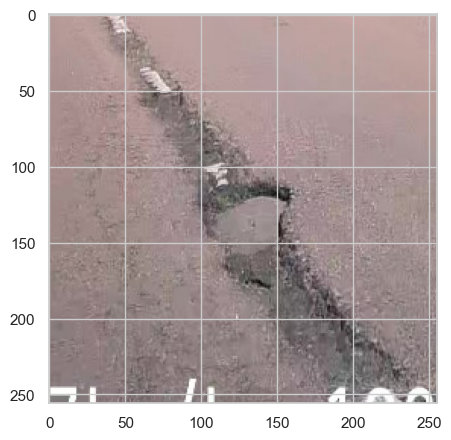

1/1 [==============================] - 0s 106ms/step


 40%|█████████████████████████████████▏                                                 | 4/10 [00:02<00:03,  1.97it/s]

Pothole Road


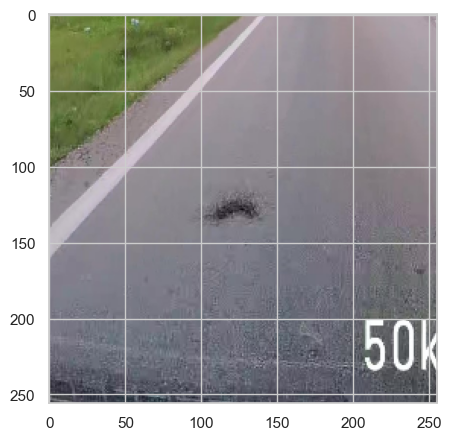

1/1 [==============================] - 0s 106ms/step


 50%|█████████████████████████████████████████▌                                         | 5/10 [00:02<00:02,  2.18it/s]

Pothole Road


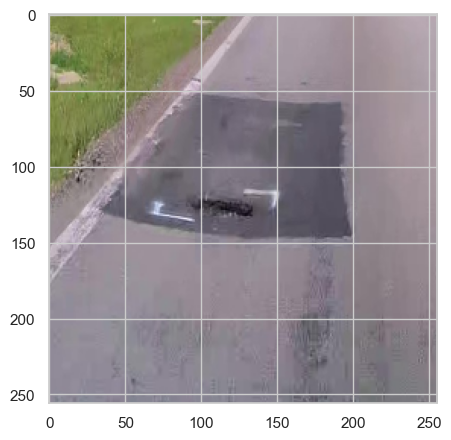

1/1 [==============================] - 0s 104ms/step


 60%|█████████████████████████████████████████████████▊                                 | 6/10 [00:03<00:01,  2.33it/s]

Pothole Road


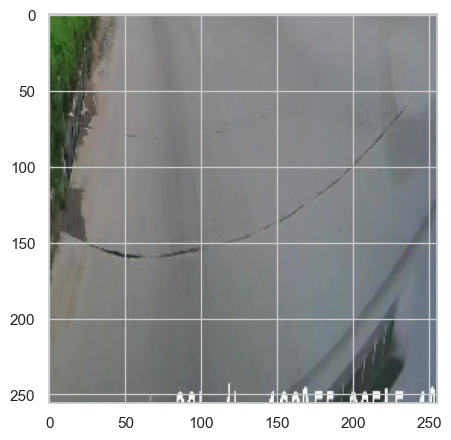

1/1 [==============================] - 0s 105ms/step


 70%|██████████████████████████████████████████████████████████                         | 7/10 [00:03<00:01,  2.44it/s]

Cracks Road


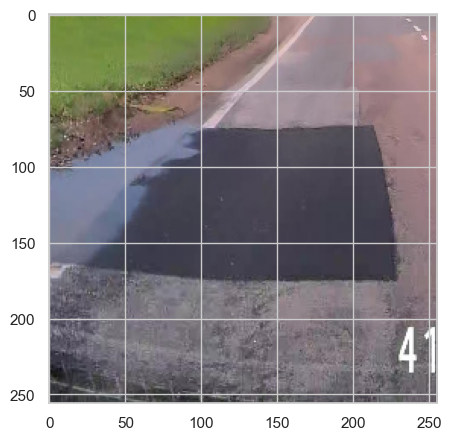

1/1 [==============================] - 0s 115ms/step


 80%|██████████████████████████████████████████████████████████████████▍                | 8/10 [00:03<00:00,  2.48it/s]

Patches Road


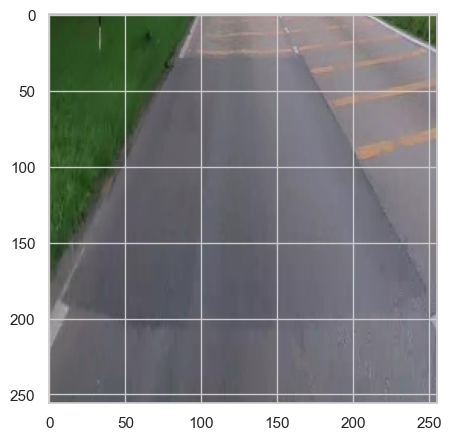

1/1 [==============================] - 0s 107ms/step


 90%|██████████████████████████████████████████████████████████████████████████▋        | 9/10 [00:04<00:00,  2.55it/s]

Patches Road


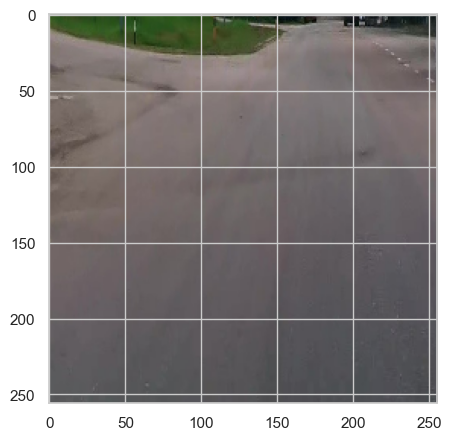

1/1 [==============================] - 0s 105ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.14it/s]

Plain Road


In [2]:
import os
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model('C:/Users/Admin/Desktop/pothole v2/model.h5')

path = "C:/Users/Admin/Desktop/predict"
files = os.listdir(path)
files

# Function to preprocess the image
def preprocess_image(path):
    img = image.load_img(img_path, target_size=(224, 224))  # Assuming 224x224 input size
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

import os

for i in tqdm(files):
    if not i.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
        print(f"Skipping non-image file: {i}")
        continue  # Skip non-image files

    pth = os.path.join(path, i)
    X = cv2.imread(pth, cv2.IMREAD_COLOR)

    if X is None or X.size == 0:
        print(f"Unable to read or empty image: {pth}")
        continue  # Skip to the next image if current one is problematic

    X = cv2.resize(X, (256, 256))

    plt.figure()
    plt.imshow(X[:, :, ::-1])
    plt.show()

    X = np.array(X)
    X = np.expand_dims(X, axis=0)

    y_pred = np.round(model.predict(X))
    if np.array_equal(y_pred[0], [1, 0, 0, 0]):
        print("Pothole Road")
    elif np.array_equal(y_pred[0], [0, 1, 0, 0]):
        print("Cracks Road")
    elif np.array_equal(y_pred[0], [0, 0, 1, 0]):
        print("Patches Road")
    else:
        print("Plain Road")


In [34]:
import os
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model
from tqdm import tqdm
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the saved model
model = load_model('C:/Users/Admin/Desktop/pothole v2/model.h5')

path = "C:/Users/Admin/Desktop/predict"
files = os.listdir(path)

predictions = []
file_names = []

for i in tqdm(files):
    if not i.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
        print(f"Skipping non-image file: {i}")
        continue  # Skip non-image files

    pth = os.path.join(path, i)
    X = cv2.imread(pth, cv2.IMREAD_COLOR)

    if X is None or X.size == 0:
        print(f"Unable to read or empty image: {pth}")
        continue  # Skip to the next image if current one is problematic

    X = cv2.resize(X, (256, 256))
    X = np.array(X)
    X = np.expand_dims(X, axis=0)

    y_pred = np.round(model.predict(X))
    if np.array_equal(y_pred[0], [1, 0, 0, 0]):
        predictions.append("Pothole Road")
    elif np.array_equal(y_pred[0], [0, 1, 0, 0]):
        predictions.append("Cracks Road")
    elif np.array_equal(y_pred[0], [0, 0, 1, 0]):
        predictions.append("Patches Road")
    else:
        predictions.append("Plain Road")
    
    file_names.append(i)

# Create a DataFrame
data = {'File Name': file_names, 'Predictions': predictions}
df = pd.DataFrame(data)

# Save DataFrame to CSV file
csv_file_path = 'predictions.csv'
df.to_csv(csv_file_path, index=False)
print(f"Predictions saved to {csv_file_path}")


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

1/1 [==============================] - 1s 786ms/step


 10%|████████▎                                                                          | 1/10 [00:00<00:07,  1.22it/s]

1/1 [==============================] - 0s 100ms/step


 20%|████████████████▌                                                                  | 2/10 [00:00<00:03,  2.45it/s]

1/1 [==============================] - 0s 98ms/step


 30%|████████████████████████▉                                                          | 3/10 [00:01<00:01,  3.55it/s]

1/1 [==============================] - 0s 110ms/step


 40%|█████████████████████████████████▏                                                 | 4/10 [00:01<00:01,  4.38it/s]

1/1 [==============================] - 0s 109ms/step


 50%|█████████████████████████████████████████▌                                         | 5/10 [00:01<00:00,  5.11it/s]

1/1 [==============================] - 0s 113ms/step


 60%|█████████████████████████████████████████████████▊                                 | 6/10 [00:01<00:00,  5.77it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████████████████████████████                         | 7/10 [00:01<00:00,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 80%|██████████████████████████████████████████████████████████████████▍                | 8/10 [00:01<00:00,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 90%|██████████████████████████████████████████████████████████████████████████▋        | 9/10 [00:01<00:00,  6.84it/s]

1/1 [==============================] - 0s 97ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  4.95it/s]

Predictions saved to predictions.csv


In [31]:
# Saves thE DataFrame to a CSV file named 'predictions.csv'.

  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

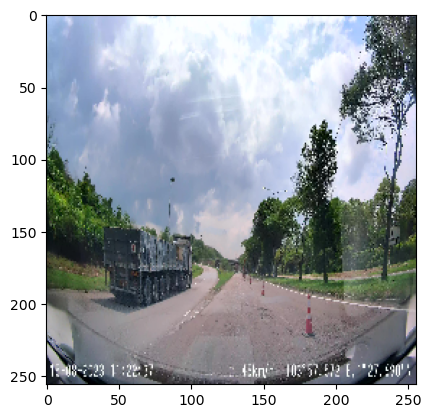

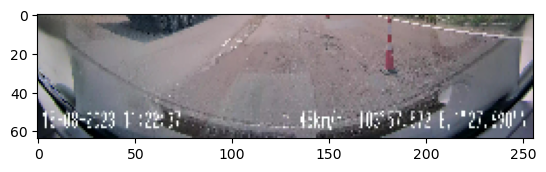

1/1 [==============================] - 1s 802ms/step


 14%|████████████                                                                        | 1/7 [00:01<00:07,  1.22s/it]

Patches Road


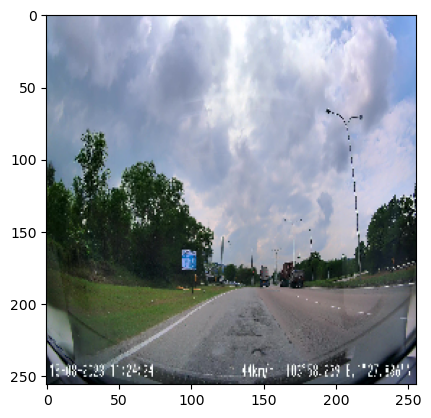

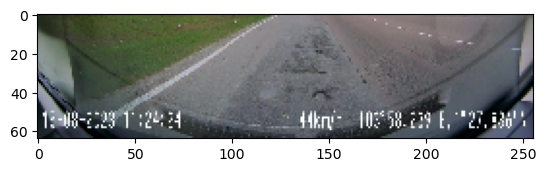

1/1 [==============================] - 0s 82ms/step


 29%|████████████████████████                                                            | 2/7 [00:01<00:03,  1.30it/s]

Cracks Road


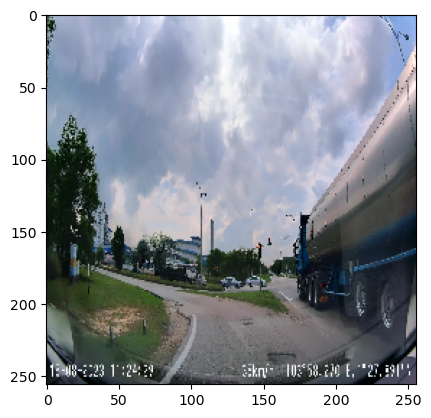

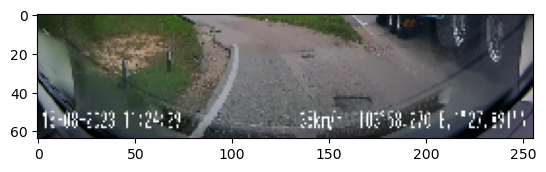

1/1 [==============================] - 0s 89ms/step


 43%|████████████████████████████████████                                                | 3/7 [00:02<00:02,  1.60it/s]

Pothole Road


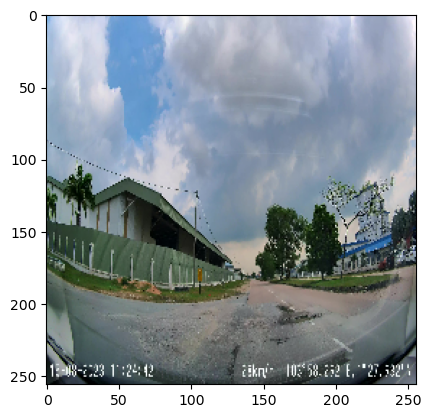

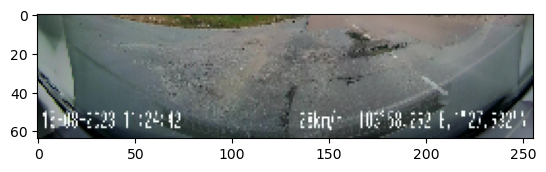

1/1 [==============================] - 0s 85ms/step


 57%|████████████████████████████████████████████████                                    | 4/7 [00:02<00:01,  1.79it/s]

Patches Road


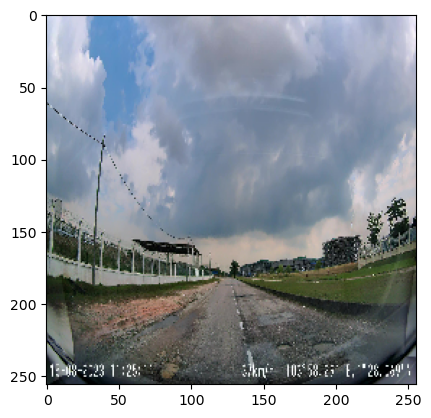

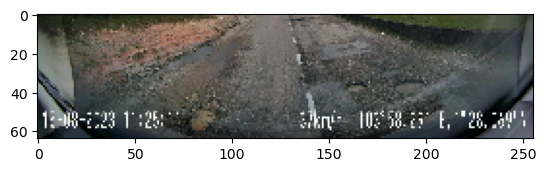

1/1 [==============================] - 0s 91ms/step


 71%|████████████████████████████████████████████████████████████                        | 5/7 [00:03<00:01,  1.92it/s]

Pothole Road


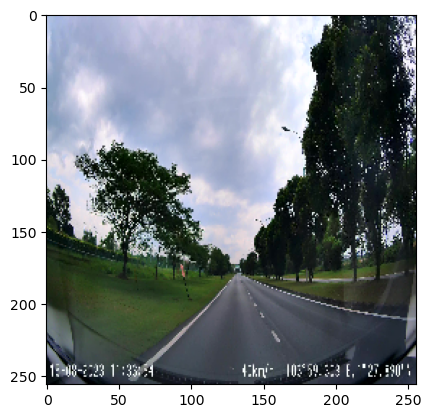

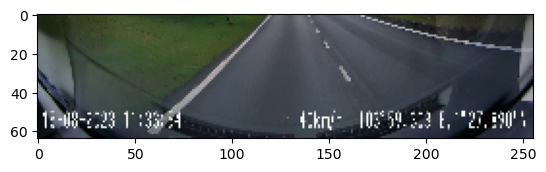

1/1 [==============================] - 0s 94ms/step


 86%|████████████████████████████████████████████████████████████████████████            | 6/7 [00:03<00:00,  2.01it/s]

Patches Road


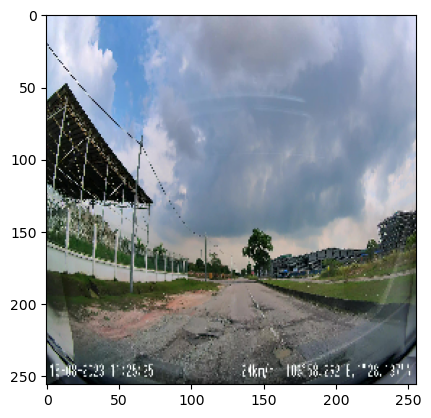

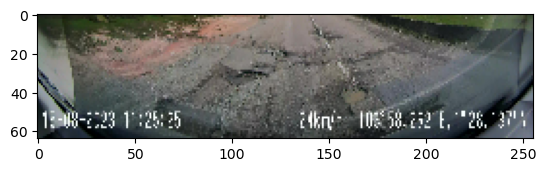

1/1 [==============================] - 0s 99ms/step


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:03<00:00,  1.77it/s]

Pothole Road


In [1]:
import os
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model
from tqdm import tqdm
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the saved model
model = load_model('C:/Users/Admin/Desktop/pothole v2/model.h5')

path = "C:/Users/Admin/Desktop/Data2"
files = os.listdir(path)

predictions = []
file_names = []

for i in tqdm(files):
    if not i.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
        print(f"Skipping non-image file: {i}")
        continue  # Skip non-image files

    pth = os.path.join(path, i)
    image = cv2.imread(pth, cv2.IMREAD_COLOR)

    if image is None or image.size == 0:
        print(f"Unable to read or empty image: {pth}")
        continue  # Skip to the next image if current one is problematic

    image = cv2.resize(image, (256, 256))  # Resize to match the model's expected input size

    plt.figure()
    plt.imshow(image[:, :, ::-1])
    plt.show()

    # Crop the bottom 1/4rd of the image
    crop_position = image.shape[0] * 3 // 4  # Crop from 1/4rd to the bottom
    cropped_image = image[crop_position:, :]

    plt.figure()
    plt.imshow(cropped_image[:, :, ::-1])
    plt.show()

    # Resize cropped image to match model's input shape
    cropped_image_resized = cv2.resize(cropped_image, (256, 256))
    cropped_image_resized = np.array(cropped_image_resized)
    cropped_image_resized = np.expand_dims(cropped_image_resized, axis=0)

    # Make predictions with the cropped and resized image
    y_pred = np.round(model.predict(cropped_image_resized))

    # Classify based on predictions
    if np.array_equal(y_pred[0], [1, 0, 0, 0]):
        print("Pothole Road")
    elif np.array_equal(y_pred[0], [0, 1, 0, 0]):
        print("Cracks Road")
    elif np.array_equal(y_pred[0], [0, 0, 1, 0]):
        print("Patches Road")
    else:
        print("Plain Road")
